In [1]:
COUNT = 3000
TRAIN = '/kaggle/input/skin-lesion-dataset/Train'

We want to use image embeddings for both EDA and classification, so let's add some code that will get image embeddings from ResNeXt.

In [2]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np


DEVICE = torch.device('cpu')
OUTPUT_SIZE = 2048

model = models.resnext50_32x4d(weights=models.ResNeXt50_32X4D_Weights.IMAGENET1K_V2)

extraction_layer = model._modules.get('avgpool')
model.to(DEVICE)
model.eval()

scaler = transforms.Resize((224, 224))
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
to_tensor = transforms.ToTensor()

def get_vec(arg, model, extraction_layer):
    image = normalize(to_tensor(scaler(arg))).unsqueeze(0).to(DEVICE)
    result = torch.zeros(1, OUTPUT_SIZE, 1, 1)
    def copy_data(m, i, o):
        result.copy_(o.data)
    hooked = extraction_layer.register_forward_hook(copy_data)
    with torch.no_grad():
        model(image)
    hooked.remove()
    return result

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-1a0047aa.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-1a0047aa.pth
100%|██████████| 95.8M/95.8M [00:00<00:00, 148MB/s]


Let's load up our data; we only have labels for our training data, so we're only going to load (a sample of) our training data. We want to load up image embeddings and thumbnails.

In [3]:
import arrow
import base64
import pandas as pd
from glob import iglob
from io import BytesIO
from os.path import basename
from PIL import Image

THUMBNAIL_SIZE = (64, 64)

def embed(model, filename: str):
    with Image.open(fp=filename, mode='r') as image:
        return get_vec(arg=image.convert('RGB'), model=model, extraction_layer=extraction_layer).numpy().reshape(OUTPUT_SIZE,)


# https://stackoverflow.com/a/952952
def flatten(arg):
    return [x for xs in arg for x in xs]

def png(filename: str) -> str:
    with Image.open(fp=filename, mode='r') as image:
        buffer = BytesIO()
        # our images are pretty big; let's shrink the hover images to thumbnail size
        image.resize(size=THUMBNAIL_SIZE).convert('RGB').save(buffer, format='png')
        return 'data:image/png;base64,' + base64.b64encode(buffer.getvalue()).decode()

def get_picture_from_glob(arg: str, tag: str,) -> list:
    time_get = arrow.now()
    result = [pd.Series(data=[tag, basename(input_file), embed(model=model, filename=input_file), png(filename=input_file)],
                        index=['tag', 'name', 'value', 'png'] )
        for index, input_file in enumerate(list(iglob(pathname=arg))) if index < 3000]
    print('encoded {} rows of {}  in {}'.format(len(result), tag, arrow.now() - time_get))
    return result

time_start = arrow.now()
train_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TRAIN + '/*')}
train_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key) for key, value in train_dict.items()]))
print('done in {}'.format(arrow.now() - time_start))

encoded 3000 rows of MEL  in 0:08:23.497330
encoded 256 rows of VASC  in 0:00:43.594735
encoded 820 rows of SCC  in 0:02:21.588545
encoded 240 rows of DF  in 0:00:37.804601
encoded 3000 rows of NV  in 0:07:58.159284
encoded 2866 rows of BKL  in 0:07:50.034429
encoded 3000 rows of BCC  in 0:08:06.288877
encoded 1580 rows of AK  in 0:04:13.623564
done in 0:40:15.650080


In [4]:
train_df['tag'].value_counts().to_frame().T

tag,MEL,NV,BCC,BKL,AK,SCC,VASC,DF
count,3000,3000,3000,2866,1580,820,256,240


Let's add x/y coordinates based on our image embeddings using TSNE.

In [5]:
from sklearn.manifold import TSNE

train_reducer = TSNE(random_state=2025, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
train_df[['x', 'y']] = train_reducer.fit_transform(X=train_df['value'].apply(func=pd.Series))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 14762 samples in 0.099s...
[t-SNE] Computed neighbors for 14762 samples in 17.933s...
[t-SNE] Computed conditional probabilities for sample 1000 / 14762
[t-SNE] Computed conditional probabilities for sample 2000 / 14762
[t-SNE] Computed conditional probabilities for sample 3000 / 14762
[t-SNE] Computed conditional probabilities for sample 4000 / 14762
[t-SNE] Computed conditional probabilities for sample 5000 / 14762
[t-SNE] Computed conditional probabilities for sample 6000 / 14762
[t-SNE] Computed conditional probabilities for sample 7000 / 14762
[t-SNE] Computed conditional probabilities for sample 8000 / 14762
[t-SNE] Computed conditional probabilities for sample 9000 / 14762
[t-SNE] Computed conditional probabilities for sample 10000 / 14762
[t-SNE] Computed conditional probabilities for sample 11000 / 14762
[t-SNE] Computed conditional probabilities for sample 12000 / 14762
[t-SNE] Computed conditional probabilities for sa

Now we're ready to plot.

In [6]:
from bokeh.models import ColumnDataSource
from bokeh.models import HoverTool

from bokeh.plotting import figure
from bokeh.plotting import output_notebook
from bokeh.plotting import show
from bokeh.palettes import Turbo256
from bokeh.transform import factor_cmap

output_notebook()

datasource = ColumnDataSource(train_df[['png', 'tag', 'x', 'y']].sample(n=2000, random_state=2025))
factor_count = max(train_df['tag'].nunique(), 3)
indices = np.linspace(0, len(Turbo256)-1, factor_count, dtype=int)
palette = [Turbo256[index] for index in indices]
mapper = factor_cmap(field_name = 'tag', palette=palette, factors=train_df['tag'].unique().tolist(), start=0, end=factor_count-1, )

plot_figure = figure(title='TSNE projection: skin lesions', width=1000, height=800, tools=('pan, wheel_zoom, reset'))

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@png' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 18px'>@tag</span>
    </div>
</div>
"""))

plot_figure.scatter(x='x', y='y', source=datasource, line_alpha=0.6, fill_alpha=0.6, size=8, color=mapper)
show(plot_figure)

Loading BokehJS ...

What do we see? TSNE doesn't produce a lot of tight, isolated clusters. Most of the data is pretty mixed. We should have low expectations regarding model accuracy. Let's build a model and get the bad news.

In [7]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(train_df['value'].apply(pd.Series), train_df['tag'], test_size=0.25, random_state=2025, stratify=train_df['tag'])
logreg = LogisticRegression(max_iter=5000, tol=1e-12).fit(X_train, y_train)
print('model fit in {} iterations'.format(logreg.n_iter_[0]))
print('accuracy: {:5.4f}'.format(accuracy_score(y_true=y_test, y_pred=logreg.predict(X=X_test))))
print('f1: {:5.4f}'.format(f1_score(average='weighted', y_true=y_test, y_pred=logreg.predict(X=X_test))))
print(classification_report(y_true=y_test, y_pred=logreg.predict(X=X_test)))

model fit in 1563 iterations
accuracy: 0.5554
f1: 0.5530
              precision    recall  f1-score   support

          AK       0.51      0.45      0.48       395
         BCC       0.56      0.64      0.59       750
         BKL       0.51      0.49      0.50       717
          DF       0.40      0.28      0.33        60
         MEL       0.58      0.58      0.58       750
          NV       0.65      0.66      0.65       750
         SCC       0.33      0.31      0.32       205
        VASC       0.70      0.50      0.58        64

    accuracy                           0.56      3691
   macro avg       0.53      0.49      0.51      3691
weighted avg       0.55      0.56      0.55      3691



An f1 of 0.5 isn't great, but it's better than a dummy model, which would have an accuracy of about 0.13. Not surprisingly, our model performs best for VASC. Let's take a look at our model probabilities.

<Axes: xlabel='probability', ylabel='Count'>

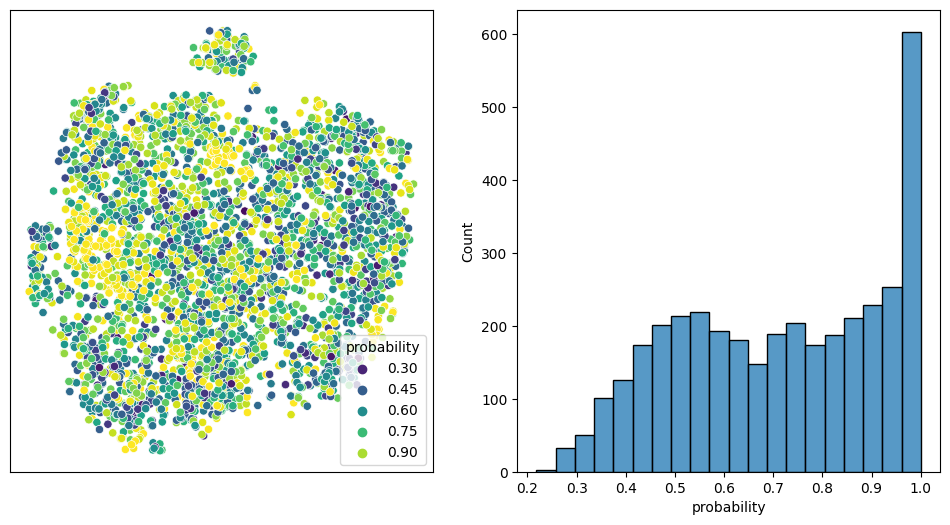

In [8]:
import matplotlib.pyplot as plt
import warnings
from seaborn import histplot
from seaborn import scatterplot

warnings.filterwarnings('ignore', category=FutureWarning, module='seaborn')

plot_df = train_df.iloc[X_test.index][['x', 'y']].copy()
plot_df['probability'] = np.max(logreg.predict_proba(X=X_test), axis=1)

plt, ax = plt.subplots(ncols=2, figsize=(12, 6))
scatterplot(ax=ax[0], data=plot_df, x='x', y='y', hue='probability', palette='viridis')
ax[0].set(xlabel=None) 
ax[0].set(ylabel=None)
ax[0].set(xticklabels=[])
ax[0].set(yticklabels=[])
ax[0].tick_params(axis='both', which='both', length=0)
histplot(ax=ax[1], data=plot_df, x='probability', bins=20)

What a mess. 